In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score

In [2]:
df = pd.read_csv('digit-recognizer/train.csv')

In [3]:
df.shape # the first columns is telling us which number is in the image
# there is total 28 x 28 images, and total are 784 pixels and all are written in columns

(42000, 785)

In [4]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
df.sample(5)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
7114,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12097,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30442,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19906,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12578,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


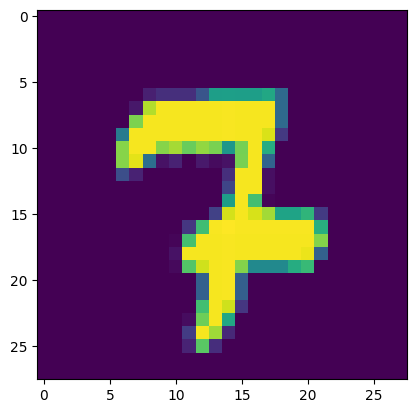

In [6]:
plt.imshow(df.iloc[678,1:].values.reshape(28, 28))

plt.show()

### Without using PCA

In [7]:
from sklearn.model_selection import train_test_split

X = df.iloc[:,1:]
y = df.iloc[:,0]

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

In [9]:
X_train.shape

(33600, 784)

In [10]:
from sklearn.neighbors import KNeighborsClassifier

In [11]:
knn = KNeighborsClassifier()

In [12]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [13]:
import time
start = time.time()
y_pred = knn.predict(X_test)  # this step takes too much time because we are working with 784 dimension space

# in 784 dimension space, we are calculating the distance of 1 given point to all other 33600 points, and after sorting them we are finding the which one is the nearest and then after finding the their label
# this is very time consuming task, so that why we are learning PCA, (we will do the same task without using PCA and using PCA)

print(time.time() - start)  

26.06855082511902


In [14]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.9648809523809524

### Using PCA

In [15]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [16]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [17]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=100)

In [18]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [19]:
X_train_trf.shape

(33600, 100)

In [20]:
knn = KNeighborsClassifier()

In [21]:
knn.fit(X_train_trf, y_train)

KNeighborsClassifier()

In [22]:
y_pred = knn.predict(X_test_trf)

In [23]:
accuracy_score(y_pred, y_test)

0.9544047619047619

In [ ]:
for i in range(1, 785):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)

    knn = KNeighborsClassifier()
    knn.fit(X_train_trf, y_train)

    y_pred = knn.predict(X_test_trf)

    accuracy = accuracy_score(y_test, y_pred)
    print("The score is: ", accuracy)

In [24]:
# transforming to a 2D coordinate system
pca = PCA(n_components=2)

X_train_trf2 = pca.fit_transform(X_train)
X_test_trf2 = pca.transform(X_test)

In [25]:
X_train_trf2.shape

(33600, 2)

In [26]:
X_train_trf2

array([[-2.71863253, -0.48982409],
       [-0.67698015, -6.75362491],
       [-3.03323281,  6.50981624],
       ...,
       [ 2.14883643,  0.78079444],
       [ 1.05957006,  0.94767312],
       [17.70258446,  1.96188185]])

In [27]:
import plotly.express as px

y_train_trf = y_train.astype(str)

fig = px.scatter(x=X_train_trf2[:,0],
                 y=X_train_trf2[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [28]:
# transforming to a 3D coordinate system
pca = PCA(n_components=3)

X_train_trf2 = pca.fit_transform(X_train)
X_test_trf2 = pca.transform(X_test)

In [29]:
X_train_trf2

array([[-2.71863253, -0.48982409,  1.1354966 ],
       [-0.67698015, -6.75362491, -2.33590139],
       [-3.03323281,  6.50981624,  7.49182983],
       ...,
       [ 2.14883643,  0.78079444, -0.74738774],
       [ 1.05957006,  0.94767312,  3.94973114],
       [17.70258446,  1.96188185, -4.94352837]])

In [30]:
import plotly.express as px

y_train_trf = y_train.astype(str)

fig = px.scatter_3d(x=X_train_trf2[:,0],
                 y=X_train_trf2[:,1],
                 z=X_train_trf2[:,2],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

In [31]:
pca.explained_variance_
# eigen values

array([40.67111198, 29.17023401, 26.74459621])

In [32]:
pca.components_.shape
# Eigen vectors

(3, 784)

In [33]:
pca.explained_variance_ratio_ # it is calculating the percentage of pca.components_ (eigen vectors)

array([0.05785192, 0.0414927 , 0.03804239])

### finding optimal component for pca

In [34]:
pca = PCA(n_components=None)

X_train_trf2 = pca.fit_transform(X_train)
X_test_trf2 = pca.transform(X_test)

In [35]:
pca.explained_variance_.shape

(784,)

In [36]:
pca.components_.shape

(784, 784)

In [37]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

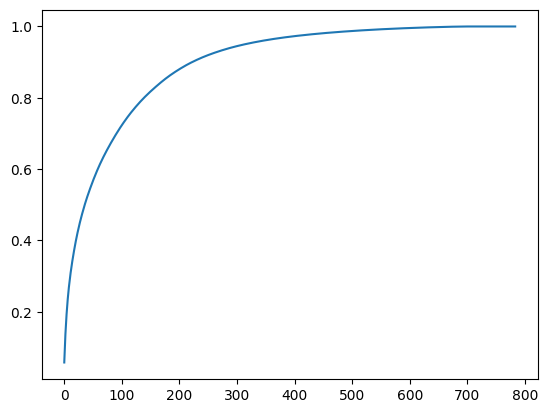

In [42]:
import matplotlib.pyplot as plt
plt.plot(np.cumsum(pca.explained_variance_ratio_)) # here we observe that by taking nearly 300 components we get 90 accuracy with less time

# every time it is recommanded to take 90 accuracy